<a href="https://colab.research.google.com/gist/slashdotmohit/865a5a257306f25fac8d9167d922c19c/src-sc.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Song Recommendation System using spotipy Library
The following is the source code (and outputs) of my project which utilises the `spotipy` library.

Please run the following two cells and then proceed if you want to test these programs yourself.

In [ ]:
! pip install spotipy
! pip install plotly==5.5.0

In [ ]:
! pip install kaggle
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json
! kaggle datasets download vatsalmavani/spotify-dataset
! unzip /content/spotify-dataset.zip

## Importing Libraries

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import spotipy
import plotly.express as px

## Reading the data
We need to load our dataset which is in an Excel `.csv` (comma separated value) file using the `pandas` library and the `pandas.read_csv()` function. 

In [ ]:
all_data = pd.read_csv('/content/data/data.csv')
genre_data = pd.read_csv('/content/data/data_w_genres.csv')
year_data = pd.read_csv('/content/data/data_by_year.csv')

All data:

In [ ]:
all_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   valence           170653 non-null  float64
 1   year              170653 non-null  int64  
 2   acousticness      170653 non-null  float64
 3   artists           170653 non-null  object 
 4   danceability      170653 non-null  float64
 5   duration_ms       170653 non-null  int64  
 6   energy            170653 non-null  float64
 7   explicit          170653 non-null  int64  
 8   id                170653 non-null  object 
 9   instrumentalness  170653 non-null  float64
 10  key               170653 non-null  int64  
 11  liveness          170653 non-null  float64
 12  loudness          170653 non-null  float64
 13  mode              170653 non-null  int64  
 14  name              170653 non-null  object 
 15  popularity        170653 non-null  int64  
 16  release_date      17

Data sorted by Genre:

In [ ]:
genre_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28680 entries, 0 to 28679
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   genres            28680 non-null  object 
 1   artists           28680 non-null  object 
 2   acousticness      28680 non-null  float64
 3   danceability      28680 non-null  float64
 4   duration_ms       28680 non-null  float64
 5   energy            28680 non-null  float64
 6   instrumentalness  28680 non-null  float64
 7   liveness          28680 non-null  float64
 8   loudness          28680 non-null  float64
 9   speechiness       28680 non-null  float64
 10  tempo             28680 non-null  float64
 11  valence           28680 non-null  float64
 12  popularity        28680 non-null  float64
 13  key               28680 non-null  int64  
 14  mode              28680 non-null  int64  
 15  count             28680 non-null  int64  
dtypes: float64(11), int64(3), object(2)
memo

Data sorted by Year:


In [ ]:
year_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              100 non-null    int64  
 1   year              100 non-null    int64  
 2   acousticness      100 non-null    float64
 3   danceability      100 non-null    float64
 4   duration_ms       100 non-null    float64
 5   energy            100 non-null    float64
 6   instrumentalness  100 non-null    float64
 7   liveness          100 non-null    float64
 8   loudness          100 non-null    float64
 9   speechiness       100 non-null    float64
 10  tempo             100 non-null    float64
 11  valence           100 non-null    float64
 12  popularity        100 non-null    float64
 13  key               100 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 11.1 KB


## Visualisation and Analysis of Data
Now, we shall use an array of graphical methods to represent the data and observe trends and significances.

### Music over time

First, we will attempt to perform a comparison of the number of tracks made every decade using a countplot (similar to a bar plot, but used esp. for counts of objects)

In [ ]:
def decade(year):
  dec = int(year/10)*10
  return f'{dec}s'
decade(2022)

'2020s'

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


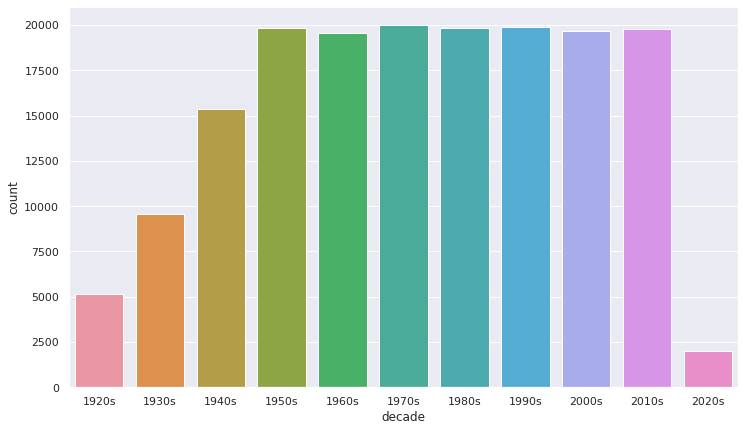

In [ ]:
all_data['decade'] = all_data['year'].apply(decade)
sns.set(rc={'figure.figsize':(12 ,7)})
sns.countplot(all_data['decade'])

This alone, however, does not give us any leads about the meaning of the data. Now, we will try to represent the variation in audio features over the years.
The audio features being evaluated here are:
1. Acousticness : Describes how guitar-y or acoustic a track is. Forexample, country songs are very acoustic, and electropop has a low acousticness.
2. Danceability : Describes how suitable a track is for dancing, judging the tempo and the energy. For example, pop music is danceable, whereas Chopin is not.
3. Energy : Describes the intensity and density of a track. For example, heavy metal is high energy, whereas slow jazz is low energy.
4. Instrumentalness: Describes the amount of non-spoken portion of the track. For example, classical music has a high instrumentalness, and hip-hop generally has a lower instrumentalness.
5. Speechiness : Describes the amount of spoken words in a track. For example, classical music has the least speechiness, and hip-hop has a high speechiness

In [ ]:
import plotly.express as px 

sound_features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'speechiness']
fig1 = px.line(year_data, x='year', y=sound_features)

fig1.show()


We can see a clear decline in acousticness and instrumentalness in songs over the years (unfortunately), and a rise in danceability of songs due to the emergence of dancepop as a prominent genre. 

We shall also look at the trend of duration of songs over the years.

In [ ]:
import plotly.express as px 

sound_features = ['duration_ms']
fig1_1 = px.line(year_data, x='year', y=sound_features, log_y = True)

fig1_1.show()

### Genre analysis
Now, we will use the genre-sorted data and try to visualise their overall similarity using clusters in scatter plots (used to display values of two different variables on the Cartesian). We achieve this clustering using the k-means clustering algorithm.

<div class="alert alert-block alert-warning"><b>$k$-means clustering:</b>
$k$-means clustering is a popularly used algorithm which attempts to group together $n$ observations into $k$ clusters. A cluster is a type of group where the member of one cluster is more similar to the other members of the cluster it belongs to rather than the other clusters. A simple illustration highlights this: 



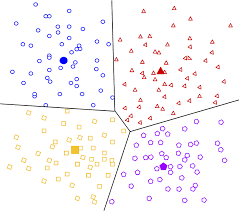

<div class="alert alert-block alert-warning">
where the central filled dots are considered the "mean" of the cluster, or the <b>cluster centroid</b>. The $k$-means algorithms clusters the observations by checking which cluster centroid is an observation closest to, and assigning that observation to the respective cluster. <br>
There are multiple variations (some heuristic) to this algorithm, majorly to improve its efficiency, because of it inherently being a computationally difficult (NP-hard) algorithm.
The standard, or naive algorithm (called so due to the existence of faster alternatives) uses <b>iterative refinement</b>. In iterative refinement, a sequence of approximations are generated, as the method converges to the optimum (or close to optimum) solution, which in this case gives us $k$ and assigns each data point to the cluster determined by the $k$-mean. <br>
To first put it in very simple words, the algorithm assigns a datapoint the cluster centroid which is nearest in terms of Euclidean distance (simply the smallest distance b/w the two points, given by $\sqrt{(x - x_0)^2 + (y - y_0)^2}$). <br>
However, mathematically, it means partitioning the observations into clusters according to the Voronoi diagram generated by the mean. A Voronoi diagram is simply a partition of a plane into regions close to a given set of objects such that for every object (called a seed), there is a region $S_i$ closer to that object than any other object. <br>
In a dataset $X$, for an initial set of $k$ means (centroids) $M = \left\{m_1^{(1)}, m_2^{(1)}, \dots, m_k^{(1)}\right\}$ and the distance between two points $d(x, y)$, observations are assigned in the following manner:
$$
S_i^{(t)} = \left\{ x_p \in X : d(x_p, m_i^{(t)}) \le d(x_p,m_j^{(t)}) \forall j, 1 \le j \le k \right\}
$$
and with every iteration, the means (centroids) are recalculated hence:
$$
m_i^{(t+1)} = \frac{1}{\#S_i^{(t)}} \sum_{x_j \in S_i^{(t)}} x_j
$$
When the assignments do not change (i.e. recalculation returns the same mean), we say that the algorithm has converged and we derive the required clusters. <br>
The question now is, how do we figure out $M$, or the initial set of means? <br>
There are a couple of ways to do this too, but the most commonly used methods are the Forgy and Random Partition methods. <br>
1. Forgy method: An initial set of $k$ means are randomly chosen from $X$, and the other observations are then assigned using the assignment step<br>
2. Random Partition: All observations are first randomly assigned clusters and then computes the initial mean using the recalculation step.
</div>


But quite relievingly (or disappointingly so), we do not have to do all the math as we already have a function to do that. The function in question is the `KMeans` function from the `scikit-learn.cluster` library. <br> For iterative refinement, this program uses a range of unsupervised learning algorithms. <br> First, the data is feature scaled using the `StandardScaler` function. Feature scaling is necessary for normalising the various observations. In our case, where we calculate the Euclidean distance between two or more features in our dataset to derive our clusters, it's essential to scale the features such that all features are equally represented in the final distance. This also makes sure the gradient descent (or the convergence of the iterative refinement process) converges much faster than when non-scaled features are used.<br>Here, the `TSNE` ($t$-distributed stochastic neighbor embedding) function aids in representing these observations/datapoints on the 2D/3D plot by modelling the high dimension (multifeatured) datapoints in a lower dimension (2D/3D) such that similar points are modelled by higher joint probability and being located closer to each other, and dissimilar points are farther away, and have a lower joint probability. It does this by creating a probability distribution over pairs of higher-dimension (multi-featured) observations (Joint Probability Distribution), where more similar observations/datapoints are assigned a higher probability, and dissimilar observations are assigned a lower probability, and then repeats the same process by constructing another distribution for the datapoints in the lower dimension (2D/3D) map. After this, it proceeds to minimise the Kullback-Leibner (KL) divergence, or the difference between the two probability distribitions with respect to the location of the datapoints on the map. The basis of similarity we will be using here is the Euclidean distance between the two datapoints, although any other relevant metric can be used.

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
X = genre_data.select_dtypes(np.number)
cluster_pipeline = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters=10))])
cluster_pipeline.fit(X)
genre_data['cluster'] = cluster_pipeline.predict(X)
tsne_pipeline = Pipeline([('scaler', StandardScaler()), ('tsne', TSNE(n_components=2, verbose=2))])
genre_embedding = tsne_pipeline.fit_transform(X)

projection = pd.DataFrame(columns=['x', 'y'], data=genre_embedding)
projection['genres'] = genre_data['genres']
projection['cluster'] = genre_data['cluster']

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 28680 samples in 0.084s...
[t-SNE] Computed neighbors for 28680 samples in 19.650s...
[t-SNE] Computed conditional probabilities for sample 1000 / 28680
[t-SNE] Computed conditional probabilities for sample 2000 / 28680
[t-SNE] Computed conditional probabilities for sample 3000 / 28680
[t-SNE] Computed conditional probabilities for sample 4000 / 28680
[t-SNE] Computed conditional probabilities for sample 5000 / 28680
[t-SNE] Computed conditional probabilities for sample 6000 / 28680
[t-SNE] Computed conditional probabilities for sample 7000 / 28680
[t-SNE] Computed conditional probabilities for sample 8000 / 28680
[t-SNE] Computed conditional probabilities for sample 9000 / 28680
[t-SNE] Computed conditional probabilities for sample 10000 / 28680
[t-SNE] Computed conditional probabilities for sample 11000 / 28680
[t-SNE] Computed conditional probabilities for sample 12000 / 28680
[t-SNE] Computed conditional probabilities for sa

Now, we have to represent these clusters and the datapoints visually. The most commonly used method to this is by using a scatter plot.

In [ ]:
fig2 = px.scatter(projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'genres'])
fig2.show()


Using a slightly modified approach from above, we shall attempt to cluster all the data, not just genre-sorted. Here, PCA (Principal Component Analysis) is used to reduce the dimension and generate a projection linearly, unlike $t$-SNE, which reduces dimension non-linearly. The key difference between PCA and $t$-SNE is that PCA tries to preserve the global structure of the data, whereas $t$-SNE is tries to preserve clusters of the data. Hence, except in certain cases, $t$-SNE is almost always better than PCA. We use PCA here due to the comparatively larger size of the overall data in comparison to that of the genre data in order to save time.

In [ ]:
song_cluster_pipeline = Pipeline([('scaler', StandardScaler()),('kmeans', KMeans(n_clusters=20, verbose=2))], verbose=True)
X = all_data.select_dtypes(np.number)
number_cols = list(X.columns)
song_cluster_pipeline.fit(X)
song_cluster_labels = song_cluster_pipeline.predict(X)
all_data['cluster_label'] = song_cluster_labels
from sklearn.decomposition import PCA

pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2))])
song_embedding = pca_pipeline.fit_transform(X)


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.1s
Initialization complete
Iteration 0, inertia 1543212.243347321
Iteration 1, inertia 1135719.739692481
Iteration 2, inertia 1108450.2583010278
Iteration 3, inertia 1095475.5324650845
Iteration 4, inertia 1086602.9622370536
Iteration 5, inertia 1082080.8434017422
Iteration 6, inertia 1078970.509458506
Iteration 7, inertia 1076760.943358704
Iteration 8, inertia 1075127.0998615604
Iteration 9, inertia 1073631.0988019328
Iteration 10, inertia 1072052.6011096064
Iteration 11, inertia 1070484.5167089445
Iteration 12, inertia 1069097.5310616097
Iteration 13, inertia 1067979.7902579214
Iteration 14, inertia 1067090.9519232889
Iteration 15, inertia 1066491.1014178083
Iteration 16, inertia 1066106.3526175856
Iteration 17, inertia 1065875.8394118184
Iteration 18, inertia 1065741.7402449436
Iteration 19, inertia 1065651.4942134973
Iteration 20, inertia 1065594.4236289915
Iteration 21, inertia 1065560.2014698163
Iteration 22, ine

In [ ]:
projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
projection['title'] = all_data['name']
projection['cluster'] = all_data['cluster_label']

fig3 = px.scatter(projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'])
fig3.show()

This is the conclusion of our Visualisation and Analysis segment. Now, I shall proceed to the main aim of this project, building the Song Recommender System.

## Building the Song Recommendation System
Before we continue, we have to add a functionality to find songs that are not in the dataset that we have used so far. This is done using the `spotipy` library.

In [ ]:
from spotipy.oauth2 import SpotifyClientCredentials
from collections import defaultdict
import os

auth_manager = SpotifyClientCredentials(client_id='07877abccd3744bb908654c82af59f27', client_secret='0de960aaaba044b38eecb5d7ec7d0589')
sp = spotipy.Spotify(auth_manager=auth_manager)

def find_song(name, year):
    
    song_data = defaultdict()
    results = sp.search(q= 'track: {} year: {}'.format(name,
                                                       year), limit=1)
    if results['tracks']['items'] == []:
        return None
    
    results = results['tracks']['items'][0]

    track_id = results['id']
    audio_features = sp.audio_features(track_id)[0]
    
    song_data['name'] = [name]
    song_data['year'] = [year]
    song_data['explicit'] = [int(results['explicit'])]
    song_data['duration_ms'] = [results['duration_ms']]
    song_data['popularity'] = [results['popularity']]
    
    for key, value in audio_features.items():
        song_data[key] = value
    
    return pd.DataFrame(song_data)
    

In [ ]:
find_song('Chemtrails Over The Country Club', 2021)

,name,year,explicit,duration_ms,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,type,id,uri,track_href,analysis_url,time_signature
0,Chemtrails Over The Country Club,2021,0,271177,74,0.334,0.276,4,-13.125,0,0.0643,0.877,0.000249,0.113,0.429,201.025,audio_features,7bPWdJgx8vek7S5i5yAtvG,spotify:track:7bPWdJgx8vek7S5i5yAtvG,https://api.spotify.com/v1/tracks/7bPWdJgx8vek...,https://api.spotify.com/v1/audio-analysis/7bPW...,3


### Generating Recommendations
Now, we shall look at the algorithm used to generate the song recommendations.
The algorithm firstly computes the mean vector of the audio features of the particular song that is given by the user. It then finds the $k$ nearest neighbors to this mean vector using the Cosine similarity:
$$d(u, v) = 1 - \frac{u \cdot v}{||u||\hspace{0.1cm}||v||} = 1 - \cos{\theta}$$
And again (to much of my disappointment), there is already a function that can do this for us. The `cdist` function from the `scipy` library is useful for finding the cosine distance between two pairs of collections of points. <br> After this, we just need to return those $k$ nearest neighbors in order to get our recommendations.

In [ ]:
from scipy.spatial.distance import cdist
import difflib

features = ['valence', 'year', 'acousticness', 'danceability', 'duration_ms', 'energy', 'explicit',
 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'popularity', 'speechiness', 'tempo']

def get_song_data(song, all_data):
    
    """
    Returns the song data of the songs input by the user (in the form of a dictionary with key:value pairs being the song name:year of release)
    """
    
    try:
        song_data = all_data[(all_data['name'] == song['name']) 
                                & (all_data['year'] == song['year'])].iloc[0]
        return song_data
    
    except IndexError:
        return find_song(song['name'], song['year'])
        

def get_mean_vector(song_list, all_data):
  
    """
    Returns the mean vector of a list of songs
    """
    
    song_vectors = []
    
    for song in song_list:
        song_data = get_song_data(song, all_data)
        if song_data is None:
            print('Error: {} does not exist in Spotify or in database'.format(song['name']))
            continue
        song_vector = song_data[number_cols].values
        song_vectors.append(song_vector)  
    
    song_matrix = np.array(list(song_vectors))
    return np.mean(song_matrix, axis=0)

def flatten_dict_list(dict_list):
   
    """
    Flattens a dictionary
    """
    
    flattened_dict = defaultdict()
    for key in dict_list[0].keys():
        flattened_dict[key] = []
    
    for dictionary in dict_list:
        for key, value in dictionary.items():
            flattened_dict[key].append(value)
            
    return flattened_dict
        

def recommend_songs(song_list, spotify_data, n_songs=10):
  
    """
    Returns recommended songs based on a list of songs that the user has input
    """
    
    metadata_cols = ['name', 'year', 'artists']
    song_dict = flatten_dict_list(song_list)
    
    song_center = get_mean_vector(song_list, spotify_data)
    scaler = song_cluster_pipeline.steps[0][1]
    scaled_data = scaler.transform(spotify_data[number_cols])
    scaled_song_center = scaler.transform(song_center.reshape(1, -1))
    distances = cdist(scaled_song_center, scaled_data, 'cosine')
    index = list(np.argsort(distances)[:, :n_songs][0])
    
    rec_songs = spotify_data.iloc[index]
    rec_songs = rec_songs[~rec_songs['name'].isin(song_dict['name'])]
    return rec_songs[metadata_cols].to_dict(orient='records')

Now, we will test out our Song Recommender function with a couple of test cases.

1. 8 (circle) - Bon Iver (2016)
2. Glory Box - Portishead (1994)
3. Karma Police - Radiohead (1997)
4. Optimistic - Radiohead (2000)
5. Hyper-ballad - Bjork (1995)


In [ ]:
recommend_songs([{'name': '8 (circle)', 'year':2016},
                {'name': 'Glory Box', 'year': 1994},
                {'name': 'Karma Police', 'year': 1997},
                {'name': 'Optimistic', 'year': 2000},
                {'name': 'Hyper-ballad', 'year': 1995}],  all_data)

Error: Hyper-ballad does not exist in Spotify or in database


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:38: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



[{'artists': "['Cigarettes After Sex']", 'name': 'Apocalypse', 'year': 2017},
 {'artists': "['Concorde']", 'name': 'Just Kiss Her', 'year': 2012},
 {'artists': "['Lorde']", 'name': 'Ribs', 'year': 2013},
 {'artists': "['Ben Howard']", 'name': 'Old Pine', 'year': 2011},
 {'artists': "['José González']", 'name': 'Step Out', 'year': 2013},
 {'artists': "['Coldplay']", 'name': 'Paradise', 'year': 2011},
 {'artists': "['Coldplay']", 'name': 'Christmas Lights', 'year': 2010},
 {'artists': "['Lana Del Rey']", 'name': 'Sad Girl', 'year': 2014},
 {'artists': "['Lana Del Rey']", 'name': 'Black Beauty', 'year': 2014},
 {'artists': "['Little Chief']", 'name': 'Mountain Song', 'year': 2014}]

Here, the listening history submitted tells us that the user listens to a lot of Indie pop music, and the recommendations highlight that too.

1. all the lonely nights in your life - American Pleasure Club (2018)
2. Killer + The Sound - Phoebe Bridgers, Noah Gundersen (2018)
3. Out of the Dark - Matt Hires (2009)
4. You Make Me Want To Die - White House Party Crashers (2017)
5. Boxing Day - blink-182 (2012)

In [ ]:
recommend_songs([{'name': 'all the lonely nights in your life', 'year':2018},
                {'name': 'Killer + The Sound', 'year':2018},
                {'name': 'Out of the Dark', 'year': 2009},
                {'name': 'You Make Me Want To Die', 'year': 2017},
                {'name': 'Boxing Day', 'year': 2012}],  all_data)

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



[{'artists': "['John Gallagher, Jr.', 'Lauren Pritchard']",
  'name': "Don't Do Sadness/Blue Wind - Original Broadway Cast Recording/2006",
  'year': 2006},
 {'artists': "['Mayday Parade']",
  'name': 'I Swear This Time I Mean It',
  'year': 2009},
 {'artists': "['Britt Nicole']", 'name': 'The Sun Is Rising', 'year': 2012},
 {'artists': "['Tim McGraw', 'Faith Hill']",
  'name': "It's Your Love",
  'year': 2015},
 {'artists': "['Ray LaMontagne', 'The Pariah Dogs']",
  'name': 'For the Summer (with The Pariah Dogs)',
  'year': 2010},
 {'artists': "['Snow Patrol']", 'name': 'New York', 'year': 2011},
 {'artists': "['Ray LaMontagne', 'The Pariah Dogs']",
  'name': 'Beg Steal or Borrow (with The Pariah Dogs)',
  'year': 2010},
 {'artists': "['Mayday Parade']",
  'name': 'I Swear This Time I Mean It',
  'year': 2009},
 {'artists': "['Ne-Yo']", 'name': 'Mirror', 'year': 2006},
 {'artists': "['Morgan Wallen']", 'name': 'Stand Alone', 'year': 2015}]

Here, the listening history tells us that the user listens to a lot of acoustic, and generally down-tempo songs. The recommendations are also on point here.

1. Search For Peace - McCoy Tyner (1967)
2. My Little Brown Book - Duke Ellington, John Coltrane (1963)
3. Lullaby Of The Leaves - Gerry Mulligan Quartet (1953)
4. A Simple Tune - Herb Ellis (1956)
5. Over The Rainbow - Lou Donaldson (1995)

In [ ]:
recommend_songs([{'name': 'Search For Peace', 'year': 1967},
                {'name': 'My Little Brown Book', 'year': 1963},
                {'name': 'Lullaby Of The Leaves', 'year': 1953},
                {'name': 'A Simple Tune', 'year': 1956},
                {'name': 'Over The Rainbow', 'year': 1995}],  all_data)

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



[{'artists': "['Bill Evans']", 'name': 'What Is There To Say?', 'year': 1959},
 {'artists': "['Bill Evans']", 'name': 'Some Other Time', 'year': 1959},
 {'artists': "['Chet Baker']", 'name': 'Alone Together', 'year': 1959},
 {'artists': "['Cannonball Adderley', 'Bill Evans']",
  'name': 'Goodbye',
  'year': 1961},
 {'artists': "['Bill Evans', 'Jim Hall']", 'name': 'Romain', 'year': 1962},
 {'artists': "['Red Garland', 'Paul Chambers', 'Art Taylor']",
  'name': 'I Know Why (And So Do You)',
  'year': 1957},
 {'artists': "['Bill Evans']", 'name': 'Peace Piece', 'year': 1959},
 {'artists': "['Frédéric Chopin', 'Arthur Rubinstein']",
  'name': 'Nocturnes, Op. 48: No. 1 in C Minor',
  'year': 1965},
 {'artists': "['Baden Powell']", 'name': 'Round About Midnight', 'year': 1966},
 {'artists': "['Chet Baker']", 'name': 'Tis Autumn', 'year': 1959}]

Here, the user's listening history tells us that the user listens to a lot of jazz and instrumental music. They are recommended Bill Evans, one of the most prominent artistes in Jazz, along with Chet Baker.